In [1]:
from scipy import *
from numpy import *
from matplotlib.pyplot import *
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from scipy.linalg import *
from numpy.linalg import *
import scipy.sparse as sp
from scipy.sparse.linalg import spsolve
from scipy.integrate import solve_ivp
from timeit import default_timer as timer
import FNC

In [2]:
# This (optional) block is for improving the display of plots.
from IPython.display import set_matplotlib_formats
set_matplotlib_formats("svg","pdf")
rcParams["figure.figsize"] = [7,4]
rcParams["lines.linewidth"] = 2
rcParams["lines.markersize"] = 4
rcParams['animation.html'] = "jshtml"  # or try "html5"

# Example 13.1.2

Consider again the example $f(x,y)=\sin(xy)$ over $[0,2\pi]\times[1,3]$, with the dimensions discretized using $m=4$ and $n=2$ equal pieces, respectively.

In [3]:
m = 4;   x = linspace(0,2*pi,m+1)
n = 2;   y = linspace(1,3,n+1)

We create a representation of the grid using two matrices created by the `meshgrid` function.

In [4]:
X,Y = meshgrid(x,y);
X

array([[0.        , 1.57079633, 3.14159265, 4.71238898, 6.28318531],
       [0.        , 1.57079633, 3.14159265, 4.71238898, 6.28318531],
       [0.        , 1.57079633, 3.14159265, 4.71238898, 6.28318531]])

In [5]:
Y

array([[1., 1., 1., 1., 1.],
       [2., 2., 2., 2., 2.],
       [3., 3., 3., 3., 3.]])

As you see above, the entries of `X` vary in the second dimension (columns), while the entries of `Y` vary along the first dimension (rows). This follows NumPy's conventions.

We can also visualize this grid on the rectangle.

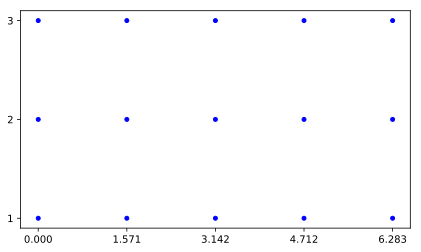

In [6]:
plot(X,Y,"bo")
xticks(x);
yticks(y);

For a given definition of $f(x,y)$ we can find $\operatorname{mtx}(f)$ by  elementwise operations on the coordinate matrices `X` and `Y`. 

In [7]:
f = lambda x,y: sin(x*y-y)
print(f(X,Y))

[[-0.84147098  0.54030231  0.84147098 -0.54030231 -0.84147098]
 [-0.90929743  0.90929743 -0.90929743  0.90929743 -0.90929743]
 [-0.14112001  0.9899925   0.14112001 -0.9899925  -0.14112001]]


We can make nice plots of the function by first choosing a much finer grid.

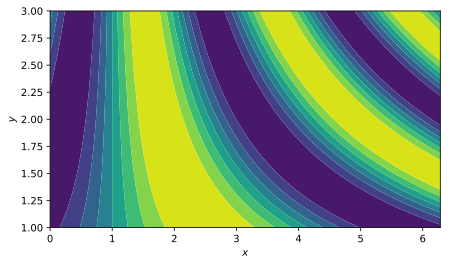

In [8]:
m = 70;   x = linspace(0,2*pi,m+1)
n = 50;   y = linspace(1,3,n+1)
X,Y = meshgrid(x,y)
F = f(X,Y)

contourf(x,y,F)
xlabel("$x$");
ylabel("$y$"); 

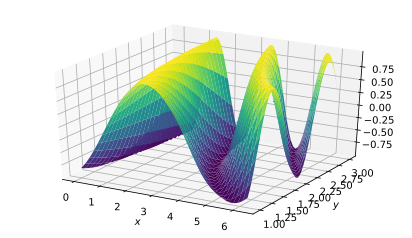

In [9]:
fig = gcf()
ax = fig.gca(projection="3d")
ax.plot_surface(X,Y,F,cmap="viridis")
xlabel("$x$");
ylabel("$y$");

# Example 13.1.3

Construction of a function over the unit disk is straightforward. We define a grid in $(r,\theta)$  space and compute accordingly. For the function $f(r,\theta)=1-r^4$, for example:

In [10]:
r = arange(41)/40
theta = linspace(0,2*pi,81)
R,Theta = meshgrid(r,theta)
F = 1-R**4

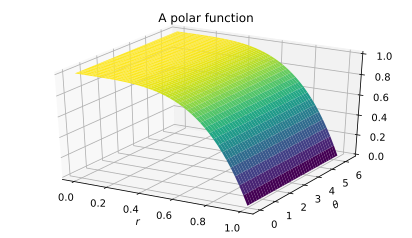

In [11]:
ax = gca(projection="3d")
ax.plot_surface(R,Theta,F,cmap="viridis")
xlabel("$r$");
ylabel("$\\theta$");
title("A polar function");

Of course we are used to seeing such plots over the $(x,y)$ plane. 

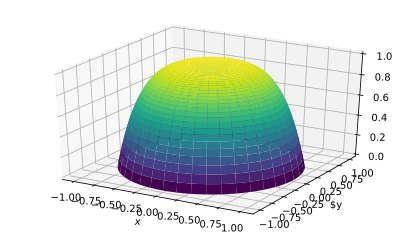

In [12]:
X = R*cos(Theta);  Y = R*sin(Theta);
ax = gca(projection="3d")
ax.plot_surface(X,Y,F,cmap="viridis")
xlabel("$x$");
ylabel("$y");

In such functions it's up to us to ensure that the values along the line $r=0$ are identical, and that the values on the line $\theta=0$ are identical to those on $\theta=2\pi$. Otherwise the interpretation of the domain as the unit disk is nonsensical.

# Example 13.1.4

We define a function and, for reference, its two exact partial derivatives.

In [13]:
u = lambda x,y: sin(x*y-y)
dudx = lambda x,y: y*cos(x*y-y)
dudy = lambda x,y: (x-1)*cos(x*y-y)

We use an equispaced grid and second order finite differences as implemented by `diffmat2`.

In [14]:
m = 80;  x,Dx,Dxx = FNC.diffmat2(m,[0,2*pi]);
n = 60;  y,Dy,Dyy = FNC.diffmat2(n,[1,3]);
X,Y = meshgrid(x,y)
U = u(X,Y)

Here we compare the exact $\partial u/\partial y$ with the finite-difference approximation. Since $y$ varies along rows, we multiply the matrix of data from the left.

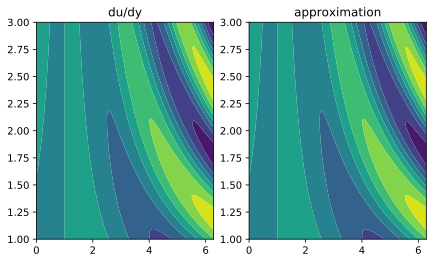

In [15]:
subplot(1,2,1)
contourf(x,y,dudy(X,Y))
title("du/dy");
subplot(1,2,2)
contourf(x,y,Dy@U)
title("approximation");     

We now do the same for $\partial u/\partial x$. These vary along columns, so we transpose, multiply, and transpose back (or the algebraic equivalent).

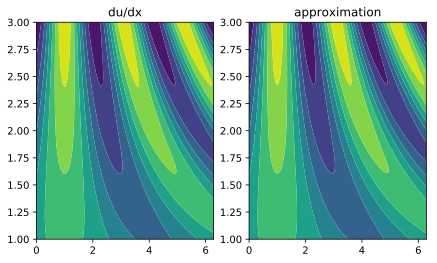

In [16]:
subplot(1,2,1)
contourf(x,y,dudx(X,Y))
title("du/dx");
subplot(1,2,2)
approx = U@Dx.T
contourf(x,y,approx)
title("approximation"); 

To the eye there is little difference to be seen, though we expect that the results probably have no more than 2-4 correct digits for these discretization sizes. 

# Example 13.2.1

In [17]:
m = 2;  n = 3;
v = 1+arange(m*n)
print(v)

[1 2 3 4 5 6]


The unvec operation:

In [18]:
V = reshape(v,(m,n)) 
print(V)

[[1 2 3]
 [4 5 6]]


Two equivalent syntaxes for the vec operation:

In [19]:
V.flatten()            

array([1, 2, 3, 4, 5, 6])

In [20]:
reshape(V,(m*n))

array([1, 2, 3, 4, 5, 6])

# Example 13.2.2

We will solve a 2D heat equation $u_t = 0.1(u_{xx} + u_{yy})$ on the square $[-1,1]\times[-1,1]$. We'll assume periodic behavior in both directions.

In [21]:
m = 60;  x,Dx,Dxx = FNC.diffper(m,[-1,1]);
n = 40;  y,Dy,Dyy = FNC.diffper(n,[-1,1]);
X,Y = meshgrid(x,y);

Note that the initial condition must also be periodic on the domain. 

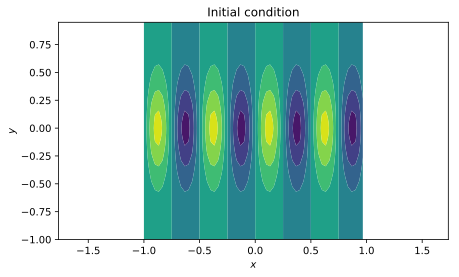

In [22]:
U0 = sin(4*pi*X)*exp(cos(pi*Y))
contourf(x,y,U0,cmap="viridis")
axis("equal");
xlabel("$x$");
ylabel("$y$");
title("Initial condition");    

The next two functions map between the natural matrix shape of the unknowns and the vector shape demanded by the ODE solvers. 

In [23]:
unpack = lambda u: reshape(u,(n,m))
pack = lambda U: reshape(U,(m*n))

This function computes the time derivative for the unknowns. The actual calculations take place using the matrix shape. 

In [24]:
def dudt(t,u):
    U = unpack(u)
    Uyy = Dyy@U;  Uxx = U@Dxx.T;     # 2nd partials
    dUdt = nu*(Uxx + Uyy)  # PDE
    return pack(dUdt)

Since this problem is parabolic, a stiff integrator is a good choice.

In [25]:
nu = 0.1
sol = solve_ivp(dudt,(0,0.2),pack(U0),method="BDF",dense_output=True)

Here we plot the solution at two times. 

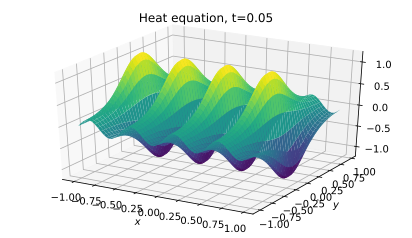

In [26]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,unpack(sol.sol(0.05)),cmap="viridis",ccount=100)
xlabel("$x$"); ylabel("$y$");
title("Heat equation, t=0.05");

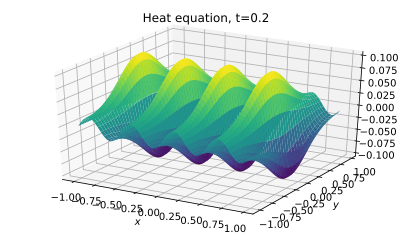

In [27]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,unpack(sol.sol(0.2)),cmap="viridis",ccount=100)
xlabel("$x$"); ylabel("$y$");
title("Heat equation, t=0.2");

# Example 13.2.3

We will solve an advection-diffusion problem, $u_t + u_x = 1 + \nu(u_{xx} + u_{yy})$, where $u=0$ on the boundary of the square $[-1,1]^2$.

In [28]:
m = 50;  n = 50;
X,Y,d = FNC.rectdisc(m,[-1,1],n,[-1,1])

We'll use a little Python trick to turn the entries in `d` into local variable assignments.

In [29]:
print("discretization fields:",d.keys())
locals().update(d)

discretization fields: dict_keys(['Dx', 'Dxx', 'Dy', 'Dyy', 'Ix', 'Iy', 'isbndy', 'vec', 'unvec'])


The initial condition we specify here is used to impose its boundary values on the solution at all times.

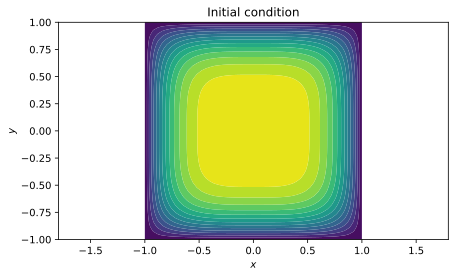

In [30]:
U0 = (1-X**4)*(1-Y**4)
contourf(X,Y,U0,levels=linspace(0,1,15))
xlabel("$x$"); ylabel("$y$"); 
axis("equal")
title("Initial condition");

This next function maps the unknowns, given in a vector shape, to a matrix of values including the boundaries.

In [31]:
interior = logical_not(isbndy)
def unpack(w):
    U = copy(U0)            # get the boundary right
    U[interior] = w  # overwrite the interior
    return U

The next function drops the boundary values and returns a vector of the interior values. It's the inverse of the `unpack` function.

In [32]:
def pack(U):
    return U[interior]

This function computes the time derivative at the interior nodes only.

In [33]:
def dwdt(t,w):
    U = unpack(w)
    Uyy = Dyy@U;  Uxx = U@Dxx.T          # 2nd partials
    dUdt = 1 - U@Dx.T + nu*(Uxx + Uyy);  # PDE
    return pack(dUdt)

Since this problem is parabolic, a stiff integrator is a good choice. (The solver usually does fine figuring this out on its own, but here we give it a hint.) 

In [34]:
nu = 0.05
sol = solve_ivp(dwdt,(0,1),pack(U0),method="BDF",dense_output=True)

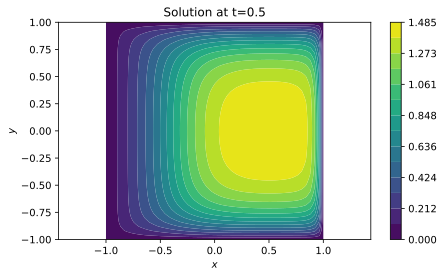

In [35]:
U = unpack(sol.sol(0.5))
contourf(X,Y,U,levels=linspace(0,amax(U),15))
colorbar();
xlabel("$x$"); ylabel("$y$"); 
axis("equal")
title("Solution at t=0.5");

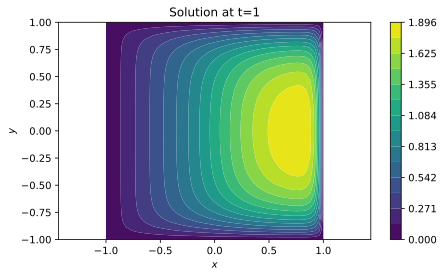

In [36]:
U = unpack(sol.sol(1))
contourf(X,Y,U,levels=linspace(0,amax(U),15))
colorbar();
xlabel("$x$"); ylabel("$y$"); 
axis("equal")
title("Solution at t=1");

# Example 13.2.4

In [37]:
m = 60;  n = 60;
X,Y,d = FNC.rectdisc(m,[-2,2],n,[-2,2]);
locals().update(d)

Here is the initial condition. The boundary values of $u$ will remain constant.

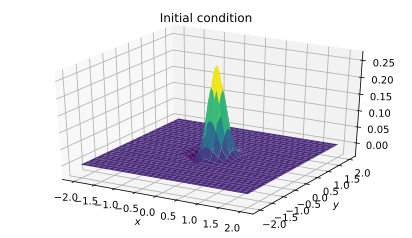

In [38]:
U0 = (X+0.2)*exp(-12*(X**2+Y**2))
V0 = zeros(U0.shape)
ax = gca(projection="3d")
ax.plot_surface(X,Y,U0,cmap="viridis")
xlabel("$x$")
ylabel("$y$")
title("Initial condition"); 

The `unpack` function separates the unknowns for $u$ and $v$, applies the boundary conditions on $u$, and returns two functions on the grid.

In [39]:
interior = logical_not(isbndy)
def unpack(w):
    numU = (m-1)*(n-1)   # number of unknowns for U
    U = copy(U0)               
    U[interior] = w[:numU]           # overwrite the interior
    V = unvec( w[numU:] )            # use all values
    return U,V

The next function drops the boundary values of $u$ and returns a vector of all the unknowns for both components of the solution. It's the inverse of the `unpack` function.

In [40]:
def pack(U,V):
    w = U[interior]
    return hstack([ w, vec(V) ])

The following function computes the time derivative of the unknowns. Besides the translation between vector and matrix shapes, it's quite straightforward.

In [41]:
def dwdt(t,w):
    U,V = unpack(w) 
    dUdt = V
    dWdt = U@Dxx.T + Dyy@U 
    return pack(dUdt,dWdt)

Since this problem is hyperbolic, not parabolic, a nonstiff integrator is fine and likely faster than a stiff integrator.

In [42]:
sol = solve_ivp(dwdt,(0,3),pack(U0,V0),method="RK45",dense_output=True)

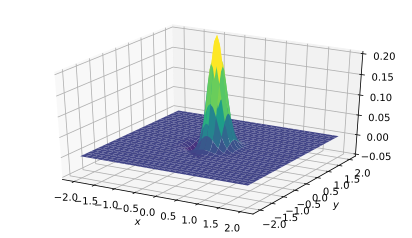

In [43]:
clf()
ax = gcf().add_subplot(111,projection="3d")
ax.cla()
surf = ax.plot_surface(X,Y,U0,cmap="viridis",vmin=-.05,vmax=.2)
ax.set_xlabel("$x$")
ax.set_ylabel("$y$")
ax.set_zlim(-0.05,0.2)

t = linspace(0,3,80)
def snapshot(j):
    global surf
    U,V = unpack(sol.sol(t[j]))
    surf.remove()
    surf = ax.plot_surface(X,Y,U,cmap="viridis",vmin=-.05,vmax=.2)
    
FuncAnimation(gcf(),snapshot,frames=len(t))

# Example 13.3.1

In [44]:
A = array([[1,2],[-2,0]])
B = array([[1,10,100],[-5,5,3]])

Applying the definition manually,

In [45]:
print(  vstack([ hstack([A[0,0]*B,A[0,1]*B]), 
                hstack([A[1,0]*B,A[1,1]*B]) ]) )

[[   1   10  100    2   20  200]
 [  -5    5    3  -10   10    6]
 [  -2  -20 -200    0    0    0]
 [  10  -10   -6    0    0    0]]


But it's simpler to use the built-in `kron`. 

In [46]:
kron(A,B)

array([[   1,   10,  100,    2,   20,  200],
       [  -5,    5,    3,  -10,   10,    6],
       [  -2,  -20, -200,    0,    0,    0],
       [  10,  -10,   -6,    0,    0,    0]])

There's an important difference between Python's conventions and those in the text. Python's natural interpretation of `vec` is as stacking rows, not columns. As a result, the Kronecker identity in the book has to be modified to $$\text{vec}(ABC^T) = (A \otimes C)\text{vec}(B).$$

# Example 13.3.2

Here is a forcing function for Poisson's equation.

In [47]:
phi = lambda x,y: x**2 - y + 2

We pick a crude discretization for illustrative purposes. We're going to turn the entries in `d` into local variable definitions.

In [48]:
m = 5;  n = 6;
X,Y,d = FNC.rectdisc(m,[0,3],n,[-1,1])
locals().update(d)

Next, we evaluate $\phi$ on the grid.

In [49]:
F = phi(X,Y)    

Here are the equations for the PDE collocation, before any modifications are made for the boundary conditions.

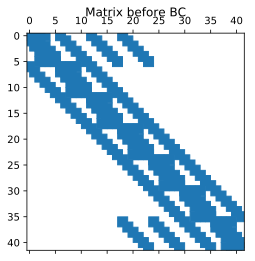

In [50]:
A = sp.kron(Iy,Dxx) + sp.kron(Dyy,Ix)
spy(A)
title("Matrix before BC");

In [51]:
b = vec(F)
b.shape

(42,)

The array `d["isbndy"]` is Boolean and the same size as `X`, `Y`, and `F`.

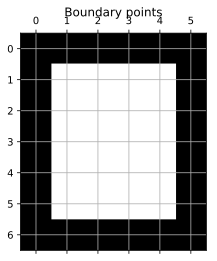

In [52]:
spy(isbndy)
title("Boundary points");
grid(True)

Next replace the boundary rows of the system by rows of the identity.

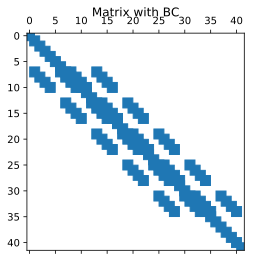

In [53]:
I = sp.eye(A.shape[0],format="lil")
A = sp.lil_matrix(A)      # needed to allow row assignments
bndy = vec(isbndy)
A[bndy,:] = I[bndy,:]     # Dirichlet conditions
A = sp.csc_matrix(A)
spy(A)
title("Matrix with BC");

Finally, we must replace the rows in the vector $\mathbf{b}$ by the boundary values being assigned to the boundary points. Here, we let the boundary values be zero everywhere. 

In [54]:
b[bndy] = 0               # Dirichlet values

Now we can solve for $\mathbf{u}$ and reinterpret it as the matrix-shaped $\mathbf{U}$, the solution on our grid. This grid is much too coarse for the result to look like a smooth function of two variables.

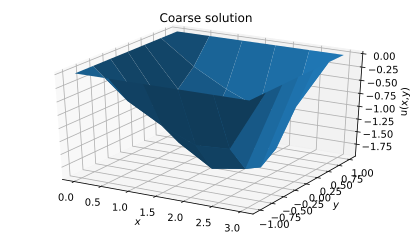

In [55]:
u = spsolve(A,b)
U = unvec(u)

ax = gca(projection="3d")
ax.plot_surface(X,Y,U)
xlabel("$x$"); ylabel("$y$"); ax.set_zlabel("u(x,y)")
title("Coarse solution");

# Example 13.3.3

First we define the problem on $[0,1]\times[0,2]$. 

In [56]:
f = lambda x,y: -sin(3*x*y-4*y)*(9*y**2+(3*x-4)**2)
g = lambda x,y: sin(3*x*y-4*y)
xspan = [0,1];  yspan = [0,2];

In [57]:
X,Y,d = FNC.rectdisc(50,xspan,80,yspan)
locals().update(d)

A = sp.kron(Iy,Dxx) + sp.kron(Dyy,Ix)
I = sp.eye((50+1)*(80+1),format="lil")

Here is the finite difference solution.

In [58]:
U,X,Y = FNC.poissonfd(f,g,50,xspan,80,yspan);

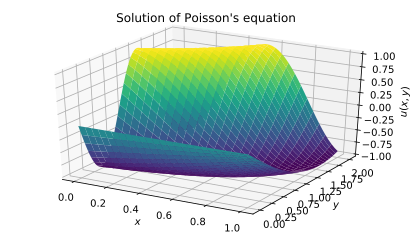

In [59]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,U,cmap="viridis")
xlabel("$x$"); ylabel("$y$"); ax.set_zlabel("$u(x,y)$")
title("Solution of Poisson's equation");

The error is a surprisingly smooth function.

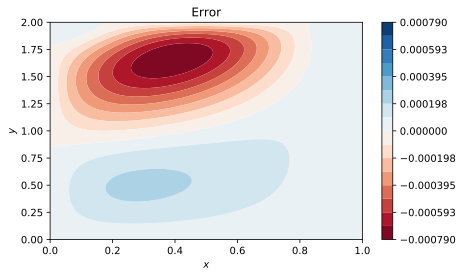

In [60]:
error = g(X,Y) - U;
M = amax(abs(error))   

contourf(X,Y,error,levels=linspace(-M,M,17),cmap="RdBu")
xlabel("$x$"); ylabel("$y$"); 
colorbar();
title("Error");

Because $u$ is specified on the boundary, we should observe that the error is zero on the boundary–else we have done something incorrectly.

# Example 13.4.3

The function here defines the PDE, by way of $\mathbf{f}(\mathbf{u})$ and its derivative (Jacobian matrix). Note that the function will have access to all of the properties of a discretization, as if they were returned by `rectdisc`.

In [61]:
lamb = 1.5

def pde(U,X,Y,d):
    LU = U@d["Dxx"].T + d["Dyy"]@U     # apply Laplacian
    F = LU - lamb/(U+1)**2             # residual

    L = sp.kron(d["Iy"],d["Dxx"]) + sp.kron(d["Dyy"],d["Ix"])
    u = d["vec"](U)
    J = L + sp.diags( 2*lamb/(u+1)**3 ) 
    return F,J

We define a trivial zero function for the Dirichlet boundary condition, and solve. 

In [62]:
g = lambda x,y:  zeros(x.shape)     # boundary condition
U,X,Y = FNC.newtonpde(pde,g,100,[0,2.5],80,[0,1]);

Norm of residual = 16.88
Norm of residual = 2.215
Norm of residual = 0.08423
Norm of residual = 0.0001551
Norm of residual = 7.662e-09
Norm of residual = 2.474e-11


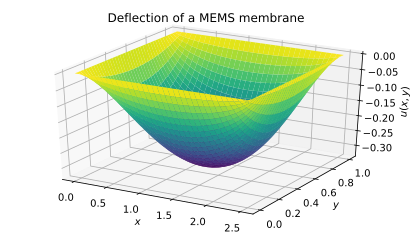

In [63]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,U,cmap="viridis")
xlabel("$x$"); ylabel("$y$"); ax.set_zlabel("$u(x,y)$");
title("Deflection of a MEMS membrane");

# Example 13.4.4

The following defines the PDE, by way of a function for $\mathbf{f}(\mathbf{u})$ and its derivative (Jacobian matrix), and a function for the Dirichlet boundary condition.

In [64]:
def pde(U,X,Y,d):
    LU = U@d["Dxx"].T + d["Dyy"]@U      # apply Laplacian
    F = U*(1-U**2) + 0.05*LU            # residual

    L = sp.kron(d["Iy"],d["Dxx"]) + sp.kron(d["Dyy"],d["Ix"])
    u = d["vec"](U)
    J = 0.05*L + sp.diags( 1-3*u**2 ) 
    return F,J

g = lambda x,y: tanh(5*(x+2*y-1))      # boundary condition

We solve the PDE and then plot the result.

In [65]:
U,X,Y = FNC.newtonpde(pde,g,100,[0,1],100,[0,1]);

Norm of residual = 50.47
Norm of residual = 11.5
Norm of residual = 0.9181
Norm of residual = 0.007233
Norm of residual = 4.983e-06
Norm of residual = 9.169e-10
Norm of residual = 1.386e-11


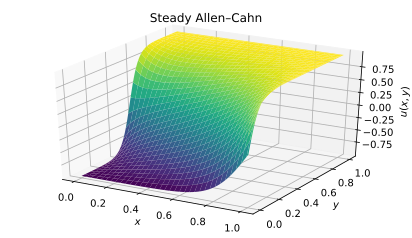

In [66]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,U,cmap="viridis")
xlabel("$x$"); ylabel("$y$"); ax.set_zlabel("$u(x,y)$");
title("Steady Allen–Cahn");

# Example 13.4.5

The following defines the PDE, by way of a function for $\mathbf{f}(\mathbf{u})$ and its derivative (Jacobian matrix), and a function for the Dirichlet boundary condition.

In [67]:
def pde(U,X,Y,d):
    LU = d["Dyy"]@U + U@d["Dxx"].T     # apply Laplacian
    Ux = U@d["Dx"].T
    F = 1 - Ux + 0.05*LU               # residual

    L = sp.kron(d["Iy"],d["Dxx"]) + sp.kron(d["Dyy"],d["Ix"])
    u = d["vec"](U)
    J = -sp.kron(d["Iy"],d["Dx"]) + 0.05*L
    return F,J

g = lambda x,y: zeros(x.shape)        # boundary condition

In [68]:
U,X,Y = FNC.newtonpde(pde,g,100,[-1,1],100,[-1,1]);

/Users/driscoll/Dropbox/books/fnc-extras/python/FNC13.py:89: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  J[vec(bndy),:] = scale*I[vec(bndy),:]


Norm of residual = 45
Norm of residual = 7.409
Norm of residual = 0.2393
Norm of residual = 0.001326
Norm of residual = 1.23e-06
Norm of residual = 1.903e-10
Norm of residual = 4.122e-12


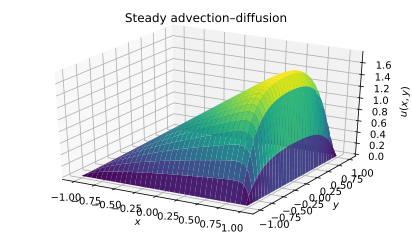

In [69]:
ax = gca(projection="3d")
ax.plot_surface(X,Y,U,cmap="viridis")
xlabel("$x$"); ylabel("$y$"); ax.set_zlabel("$u(x,y)$");
title("Steady advection–diffusion");